In [12]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [13]:
df = pd.read_csv("dataset/2012_2019_PlatteRiverWeir_features_merged_all.csv", index_col=0)
df.columns = df.columns.str.replace(' ', '')
df

,SensorTime,CaptureTime,Filename,Agency,SiteNumber,TimeZone,Stage,Discharge,CalcTimestamp,width,...,WeirPt2X,WeirPt2Y,WwRawLineMin,WwRawLineMax,WwRawLineMean,WwRawLineSigma,WwCurveLineMin,WwCurveLineMax,WwCurveLineMean,WwCurveLineSigma
0,2012-06-09 13:15:00,2012-06-09T13:09:07,StateLineWeir_20120609_Farrell_001.jpg,USGS,6674500,MDT,2.99,916.0,2020-03-11T16:58:28,4288,...,-1,-1,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
1,2012-06-09 13:15:00,2012-06-09T13:10:29,StateLineWeir_20120609_Farrell_002.jpg,USGS,6674500,MDT,2.99,916.0,2020-03-11T16:58:33,4288,...,-1,-1,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
2,2012-06-09 13:45:00,2012-06-09T13:44:01,StateLineWeir_20120609_Farrell_003.jpg,USGS,6674500,MDT,2.96,873.0,2020-03-11T16:58:40,4288,...,-1,-1,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
3,2012-06-09 14:45:00,2012-06-09T14:44:30,StateLineWeir_20120609_Farrell_004.jpg,USGS,6674500,MDT,2.94,846.0,2020-03-11T16:58:47,4288,...,-1,-1,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
4,2012-06-09 15:45:00,2012-06-09T15:44:59,StateLineWeir_20120609_Farrell_005.jpg,USGS,6674500,MDT,2.94,846.0,2020-03-11T16:58:55,4288,...,-1,-1,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42054,2019-10-11 09:00:00,2019-10-11T08:59:53,StateLineWeir_20191011_Farrell_409.jpg,USGS,6674500,MDT,2.54,434.0,2020-03-12T16:23:53,4288,...,2446,1900,9284.0,77521.0,38385.370066,15952.029728,0.0,70085.0,37550.894823,16444.401209
42055,2019-10-11 10:00:00,2019-10-11T09:59:52,StateLineWeir_20191011_Farrell_410.jpg,USGS,6674500,MDT,2.54,434.0,2020-03-12T16:23:54,4288,...,2440,1900,10092.0,74614.0,40162.989292,15467.708856,0.0,70061.0,39397.339095,16009.008049
42056,2019-10-11 11:00:00,2019-10-11T10:59:52,StateLineWeir_20191011_Farrell_411.jpg,USGS,6674500,MDT,2.54,434.0,2020-03-12T16:23:55,4288,...,2447,1900,7067.0,83260.0,42095.946590,16770.357949,0.0,76335.0,41350.006568,17489.374617
42057,2019-10-11 12:00:00,2019-10-11T11:59:53,StateLineWeir_20191011_Farrell_412.jpg,USGS,6674500,MDT,2.54,434.0,2020-03-12T16:23:56,4288,...,2443,1900,6283.0,83045.0,45345.490954,17498.432849,0.0,78882.0,44553.920296,18268.294896


Stage = $ft^3/s$

Discharge = $ft^3/s$

## Study dataset

In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 42059 entries, 0 to 42058
Data columns (total 59 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   SensorTime        42059 non-null  object 
 1   CaptureTime       42059 non-null  object 
 2   Filename          42059 non-null  object 
 3   Agency            42059 non-null  object 
 4   SiteNumber        42059 non-null  int64  
 5   TimeZone          42059 non-null  object 
 6   Stage             42059 non-null  float64
 7   Discharge         42059 non-null  float64
 8   CalcTimestamp     42059 non-null  object 
 9   width             42059 non-null  int64  
 10  height            42059 non-null  int64  
 11  exposure          42059 non-null  float64
 12  fNumber           42059 non-null  float64
 13  isoSpeed          42059 non-null  int64  
 14  shutterSpeed      42059 non-null  float64
 15  grayMean          42059 non-null  float64
 16  graySigma         42059 non-null  float6

In [5]:
df.describe()

,SiteNumber,Stage,Discharge,width,height,exposure,fNumber,isoSpeed,shutterSpeed,grayMean,...,WeirPt2X,WeirPt2Y,WwRawLineMin,WwRawLineMax,WwRawLineMean,WwRawLineSigma,WwCurveLineMin,WwCurveLineMax,WwCurveLineMean,WwCurveLineSigma
count,42059.0,42059.000000,42059.000000,42059.000000,42059.000000,42059.000000,42059.000000,42059.000000,42059.000000,42059.000000,...,42059.000000,42059.000000,42059.000000,42059.000000,42059.000000,42059.000000,42059.0,42059.000000,42059.000000,42059.000000
mean,6674500.0,2.878743,970.956439,4288.122114,2848.082170,0.161720,4.001284,200.261537,-0.886029,94.079832,...,1898.152025,1632.199410,1977.239592,65649.770061,30264.791367,15731.203913,0.0,60178.912979,29772.190243,15696.114426
std,0.0,0.805533,1192.272290,14.458545,9.729114,0.927797,0.087761,31.007433,1.128978,15.028168,...,781.483283,661.348746,4652.898679,32223.396961,18033.801170,8019.757666,0.0,30401.134688,17742.927957,8116.052744
min,6674500.0,0.000000,0.000000,4288.000000,2848.000000,0.000125,4.000000,200.000000,-3.000000,55.006235,...,-1.000000,-1.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000
25%,6674500.0,2.280000,213.000000,4288.000000,2848.000000,0.000400,4.000000,200.000000,-1.000000,85.048836,...,2065.000000,1900.000000,0.000000,54055.000000,22276.942952,12542.627859,0.0,48217.500000,21865.041625,12283.186085
50%,6674500.0,2.550000,388.000000,4288.000000,2848.000000,0.000800,4.000000,200.000000,-1.000000,93.352083,...,2144.000000,1900.000000,0.000000,71156.000000,30991.115132,16836.506394,0.0,64319.000000,30465.611018,16720.918634
75%,6674500.0,3.290000,1350.000000,4288.000000,2848.000000,0.004000,4.000000,200.000000,-1.000000,102.487423,...,2264.000000,1900.000000,1869.000000,87312.000000,39182.093440,20831.296076,0.0,80074.500000,38551.906070,20913.502125
max,6674500.0,6.490000,7920.000000,6000.000000,4000.000000,25.000000,13.000000,4000.000000,12.643856,168.998160,...,3275.000000,1900.000000,68747.000000,132262.000000,113048.598055,48565.667751,0.0,130865.000000,110286.915789,48267.082318


In [5]:
df.isna().sum()

SensorTime          0
CaptureTime         0
Filename            0
Agency              0
SiteNumber          0
TimeZone            0
Stage               0
Discharge           0
CalcTimestamp       0
width               0
height              0
exposure            0
fNumber             0
isoSpeed            0
shutterSpeed        0
grayMean            0
graySigma           0
entropyMean         0
entropySigma        0
hMean               0
hSigma              0
sMean               0
sSigma              0
vMean               0
vSigma              0
areaFeatCount       0
grayMean0           0
graySigma0          0
entropyMean0        0
entropySigma0       0
hMean0              0
hSigma0             0
sMean0              0
sSigma0             0
vMean0              0
vSigma0             0
grayMean1           0
graySigma1          0
entropyMean1        0
entropySigma1       0
hMean1              0
hSigma1             0
sMean1              0
sSigma1             0
vMean1              0
vSigma1   

In [7]:
count = 0
for i in df.isna().sum():
    if i > 0:
        count += 1

count

0

### Drop the data that is not necessary for training 

In [15]:
df.drop(columns=['Filename', 'Agency', 'SiteNumber',
       'TimeZone', 'CalcTimestamp'], inplace=True)

### Convert the values of time from object to datetime type

In [16]:
df['SensorTime'] = pd.to_datetime(df['SensorTime'])
df['CaptureTime'] = pd.to_datetime(df['CaptureTime'])

In [6]:
df.dtypes

SensorTime          datetime64[ns]
CaptureTime         datetime64[ns]
Stage                      float64
Discharge                  float64
width                        int64
height                       int64
exposure                   float64
fNumber                    float64
isoSpeed                     int64
shutterSpeed               float64
grayMean                   float64
graySigma                  float64
entropyMean                float64
entropySigma               float64
hMean                      float64
hSigma                     float64
sMean                      float64
sSigma                     float64
vMean                      float64
vSigma                     float64
areaFeatCount                int64
grayMean0                  float64
graySigma0                 float64
entropyMean0               float64
entropySigma0              float64
hMean0                     float64
hSigma0                    float64
sMean0                     float64
sSigma0             

### Check if data is non-stationary

In [10]:
from statsmodels.tsa.stattools import adfuller

adfuller(df["Stage"])[1]

0.0023427789709606125

In [11]:
adfuller(df["Discharge"])[1]

0.00015108329434942365

The p-value of both of them is less than 0.05, so the null hypothesis is rejected, the data is stationary.

### Check autocorrelation

<AxesSubplot:xlabel='Lag', ylabel='Autocorrelation'>

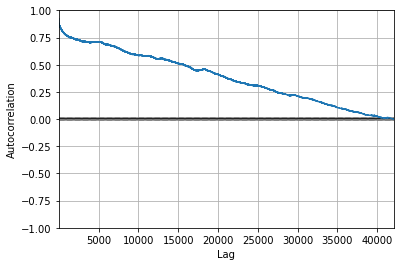

In [18]:
from pandas.plotting import autocorrelation_plot

autocorrelation_plot(df.drop(columns=["CaptureTime", "SensorTime"]))

The autocorrelation plot doesn't have a sinusoidal form, so we can probably say that the values do not have seasonality

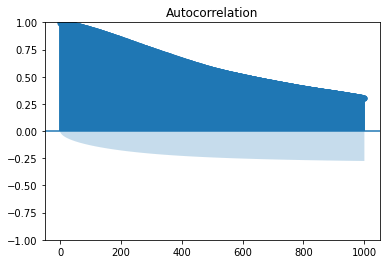

In [24]:
from statsmodels.graphics.tsaplots import plot_acf
plot_acf(df["Stage"], lags=1000)
plt.show()

remove the hight autocorrelation

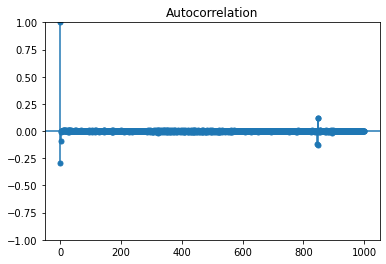

In [9]:
from statsmodels.graphics.tsaplots import plot_acf
data_diff = df["Stage"] - df["Stage"].shift(1)
plot_acf(data_diff[1:], lags=1000)
plt.show()


### Covariance determinant

In [7]:
cov = df.cov(ddof=1)
det = np.linalg.det(cov)
det


0.0

Determinant is zero, so maybe we can use PCA on the dataset

### Correlation heatmap

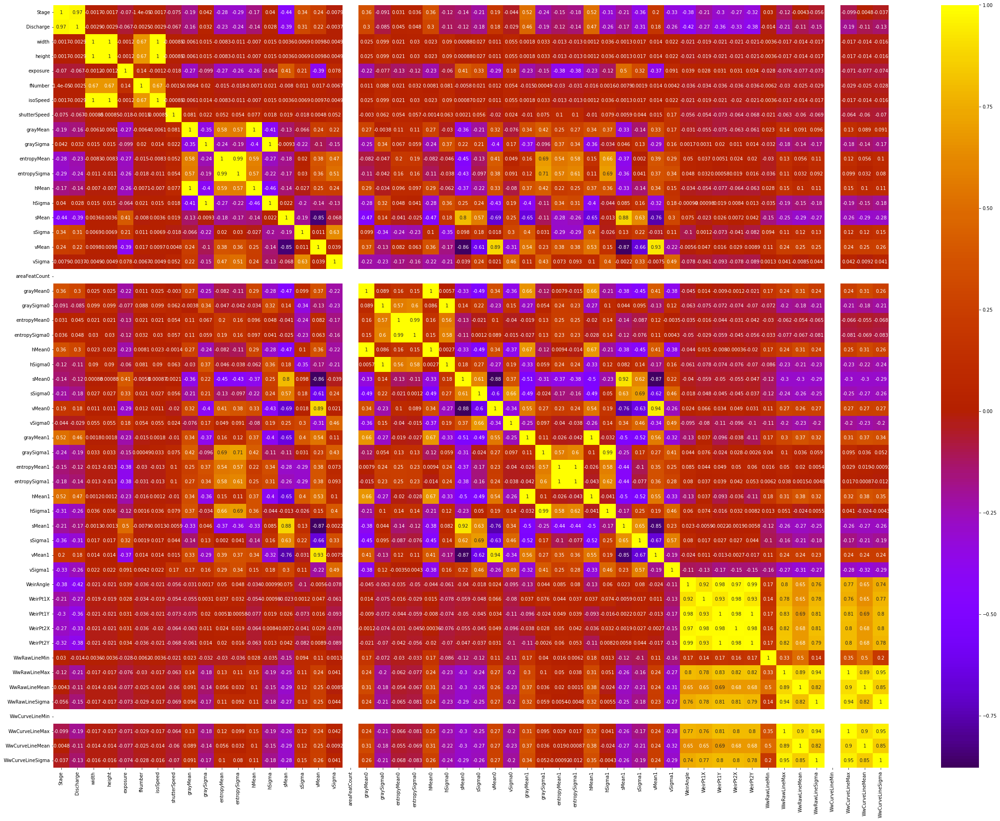

In [11]:
# save correlations to variable
corr = df.corr() # pearson correlation

# generate heatmap
plt.figure(figsize=(40,30))
sns.heatmap(corr, annot=True, center=0, cmap='gnuplot')
plt.show()

#### Invalid coefficient features (rejected) from correlation map

In [43]:
to_drop = [column for column in corr.columns if pd.isnull(corr[column])[1]]
print(to_drop)


['areaFeatCount', 'WwCurveLineMin']


#### Highly correlated features

In [19]:
upper_tri = corr.where(np.triu(np.ones(corr.shape),k=1).astype(bool))
print(upper_tri)
  
to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.95) and column != "Stage" and column != "Discharge"]
print(to_drop)
print(len(to_drop))

                  Stage  Discharge     width    height  exposure   fNumber  \
Stage               NaN   0.970307 -0.001664 -0.001664 -0.070197 -0.000014   
Discharge           NaN        NaN -0.002883 -0.002883 -0.067425 -0.002509   
width               NaN        NaN       NaN  1.000000 -0.001169  0.673548   
height              NaN        NaN       NaN       NaN -0.001169  0.673548   
exposure            NaN        NaN       NaN       NaN       NaN  0.137941   
fNumber             NaN        NaN       NaN       NaN       NaN       NaN   
isoSpeed            NaN        NaN       NaN       NaN       NaN       NaN   
shutterSpeed        NaN        NaN       NaN       NaN       NaN       NaN   
grayMean            NaN        NaN       NaN       NaN       NaN       NaN   
graySigma           NaN        NaN       NaN       NaN       NaN       NaN   
entropyMean         NaN        NaN       NaN       NaN       NaN       NaN   
entropySigma        NaN        NaN       NaN       NaN       NaN

### Create dataframes for the ground truth data and for the data we are going to use to train

In [7]:
df_y = df[["Stage", "Discharge"]]
df_x = df.drop(columns=["SensorTime", "Stage", "Discharge"])

### Study data with all features (generic and hand-crafted)

#### Make histograms of all features

In [11]:
from datetime import datetime

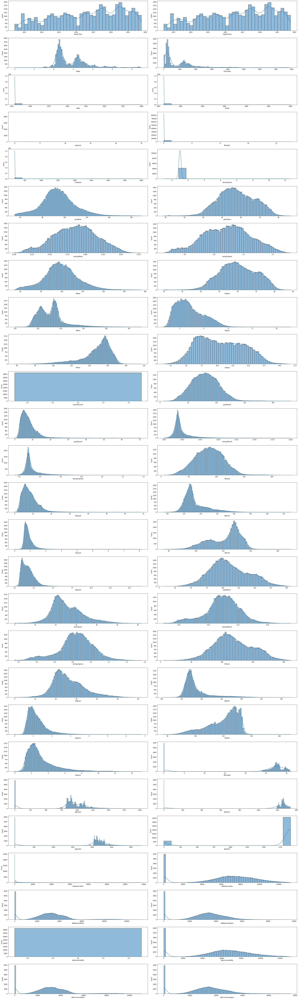

In [12]:
rows = int(np.ceil(df.shape[1] / 2))
fig, axes = plt.subplots(nrows=rows, ncols=2, figsize=(30, 100))


for ax, col in zip(axes.flatten(), df):
    if df[col].dtype != np.datetime64:
        sns.histplot(df[col], kde=True, ax=ax)

fig.tight_layout()

#### Time series Graph

In [17]:
df_time = df.copy()
df_time["month"] = df_time.CaptureTime.dt.month
df_time["yearTime"] = df_time.groupby(
    df_time.CaptureTime.dt.year).cumcount()
df_time["year"] = df_time.CaptureTime.dt.year

years = np.unique(df_time.CaptureTime.dt.year)

rows = int(np.ceil(df_time.shape[1] / 2))

##### Time series Graph based on x=yeartime, y=col

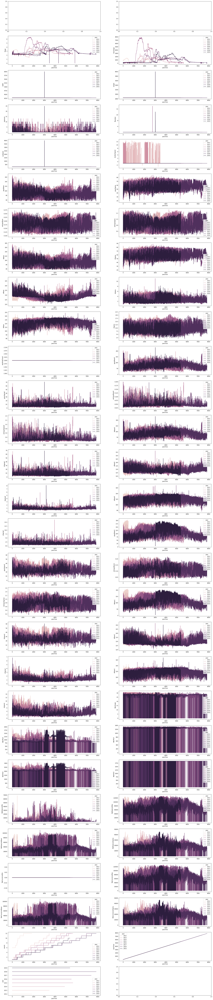

In [38]:
fig, axes = plt.subplots(nrows=rows, ncols=2, figsize=(30, 150))

for ax, col in zip(axes.flatten(), df_time):
    #data_plot = df_time_generic[df_time_generic.CaptureTime.dt.year == year]
    if not np.issubdtype(df_time[col].dtype, np.datetime64):
        sns.lineplot(x="yearTime", y=col,
                     data=df_time, estimator=None, n_boot=0, errorbar=None, hue="year", legend="full", ax=ax)


##### Time series Graph based on x=month, y=col

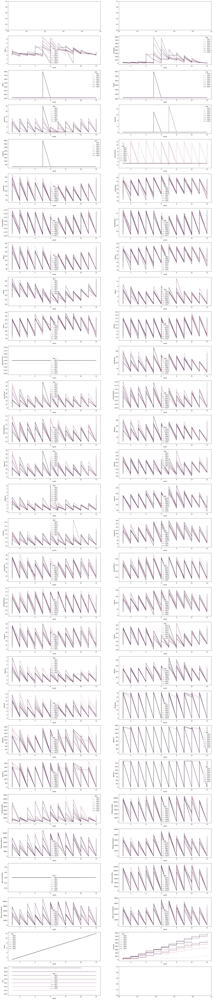

In [39]:
fig, axes = plt.subplots(nrows=rows, ncols=2, figsize=(30, 150))

for ax, col in zip(axes.flatten(), df_time):
    #data_plot = df_time_generic[df_time_generic.CaptureTime.dt.year == year]
    if not np.issubdtype(df_time[col].dtype, np.datetime64):
        sns.lineplot(x="month", y=col,
                     data=df_time, estimator=None, n_boot=0, errorbar=None, hue="year", legend="full", ax=ax)

##### Time series graph of stage and discharge through the years

<AxesSubplot:ylabel='Discharge'>

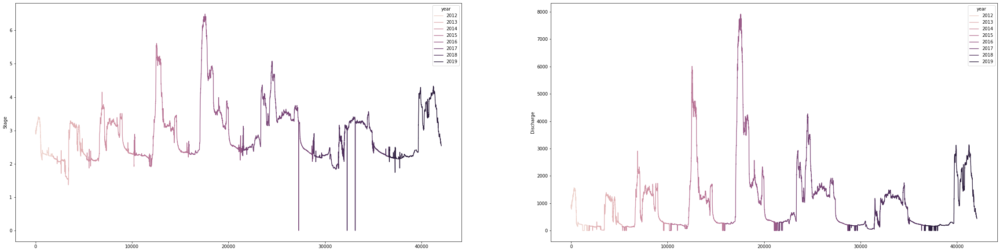

In [23]:
fig, axes = plt.subplots(ncols=2, figsize=(40, 10))

sns.lineplot(x=np.arange(0, df_time.shape[0]), y="Stage", data=df_time, estimator=None, n_boot=0, errorbar=None, hue="year", legend="full", ax=axes[0])
sns.lineplot(x=np.arange(0, df_time.shape[0]), y="Discharge", data=df_time, estimator=None, n_boot=0, errorbar=None, hue="year", legend="full", ax=axes[1])

#### Feature selection

In [94]:
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import Lasso
from sklearn.feature_selection import SelectFromModel

In [108]:
X_train, X_test, y_train, y_test = train_test_split(df_x.drop(columns="CaptureTime"), df_y, test_size=0.33, random_state=42)

In [109]:
pipeline = Pipeline([
                     ('scaler',StandardScaler()),
                     ('model',Lasso(tol=1e-2, max_iter=2000))
])

In [110]:
feature_selection = SelectFromModel(GridSearchCV(pipeline,
                      {'model__alpha':np.arange(0.1,10,0.1)},
                      cv = 5, scoring="neg_mean_squared_error",verbose=3, n_jobs=8), importance_getter='best_estimator_.named_steps.clf.coef_')

In [111]:
feature_selection.fit(X_train, y_train)

Fitting 5 folds for each of 99 candidates, totalling 495 fits


/Users/andresnowak/miniforge3/envs/AI/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.469e+09, tolerance: 3.309e+08
  model = cd_fast.enet_coordinate_descent(
/Users/andresnowak/miniforge3/envs/AI/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.546e+09, tolerance: 3.282e+08
  model = cd_fast.enet_coordinate_descent(
/Users/andresnowak/miniforge3/envs/AI/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features

[CV 1/5] END ............model__alpha=0.2;, score=-293728.173 total time=   3.3s
[CV 4/5] END ............model__alpha=0.1;, score=-307207.650 total time=   3.3s
[CV 2/5] END ............model__alpha=0.1;, score=-321541.903 total time=   3.4s
[CV 1/5] END ............model__alpha=0.1;, score=-293359.608 total time=   3.4s
[CV 3/5] END ............model__alpha=0.1;, score=-301025.204 total time=   3.4s
[CV 5/5] END ............model__alpha=0.1;, score=-301299.266 total time=   3.4s
[CV 2/5] END ............model__alpha=0.2;, score=-322338.350 total time=   3.4s
[CV 3/5] END ............model__alpha=0.2;, score=-301455.795 total time=   3.4s


/Users/andresnowak/miniforge3/envs/AI/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.209e+09, tolerance: 3.229e+08
  model = cd_fast.enet_coordinate_descent(
/Users/andresnowak/miniforge3/envs/AI/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.394e+09, tolerance: 3.309e+08
  model = cd_fast.enet_coordinate_descent(
/Users/andresnowak/miniforge3/envs/AI/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features

[CV 2/5] END model__alpha=0.30000000000000004;, score=-323268.237 total time=   3.3s
[CV 1/5] END ............model__alpha=0.4;, score=-294756.971 total time=   3.4s
[CV 5/5] END ............model__alpha=0.2;, score=-301868.399 total time=   3.4s
[CV 1/5] END model__alpha=0.30000000000000004;, score=-294248.987 total time=   3.4s
[CV 5/5] END model__alpha=0.30000000000000004;, score=-302611.544 total time=   3.4s
[CV 4/5] END ............model__alpha=0.2;, score=-307704.653 total time=   3.4s
[CV 4/5] END model__alpha=0.30000000000000004;, score=-308349.951 total time=   3.4s
[CV 3/5] END model__alpha=0.30000000000000004;, score=-302044.424 total time=   3.5s


/Users/andresnowak/miniforge3/envs/AI/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.236e+09, tolerance: 3.229e+08
  model = cd_fast.enet_coordinate_descent(
/Users/andresnowak/miniforge3/envs/AI/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.312e+09, tolerance: 3.229e+08
  model = cd_fast.enet_coordinate_descent(
/Users/andresnowak/miniforge3/envs/AI/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features

[CV 2/5] END ............model__alpha=0.4;, score=-324297.897 total time=   3.3s
[CV 2/5] END ............model__alpha=0.5;, score=-325439.862 total time=   3.3s
[CV 3/5] END ............model__alpha=0.4;, score=-302727.862 total time=   3.4s
[CV 1/5] END ............model__alpha=0.5;, score=-295353.176 total time=   3.4s
[CV 3/5] END ............model__alpha=0.5;, score=-303481.394 total time=   3.4s
[CV 4/5] END ............model__alpha=0.4;, score=-309000.707 total time=   3.4s
[CV 5/5] END ............model__alpha=0.4;, score=-303450.754 total time=   3.4s


/Users/andresnowak/miniforge3/envs/AI/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.433e+09, tolerance: 3.282e+08
  model = cd_fast.enet_coordinate_descent(


[CV 4/5] END ............model__alpha=0.5;, score=-309770.439 total time=   3.4s
[CV 2/5] END model__alpha=0.7000000000000001;, score=-327923.945 total time=   1.8s
[CV 1/5] END model__alpha=0.7000000000000001;, score=-297101.159 total time=   2.0s


/Users/andresnowak/miniforge3/envs/AI/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.279e+09, tolerance: 3.265e+08
  model = cd_fast.enet_coordinate_descent(
/Users/andresnowak/miniforge3/envs/AI/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.587e+08, tolerance: 3.309e+08
  model = cd_fast.enet_coordinate_descent(
/Users/andresnowak/miniforge3/envs/AI/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features

[CV 5/5] END ............model__alpha=0.5;, score=-304392.789 total time=   3.3s
[CV 1/5] END ............model__alpha=0.6;, score=-296124.139 total time=   3.3s
[CV 2/5] END ............model__alpha=0.6;, score=-326782.367 total time=   3.3s
[CV 5/5] END ............model__alpha=0.6;, score=-305566.177 total time=   3.2s
[CV 4/5] END ............model__alpha=0.6;, score=-310813.093 total time=   3.4s
[CV 3/5] END ............model__alpha=0.6;, score=-304386.372 total time=   3.4s
[CV 3/5] END model__alpha=0.7000000000000001;, score=-305483.259 total time=   2.1s
[CV 4/5] END model__alpha=0.7000000000000001;, score=-312058.573 total time=   2.0s
[CV 2/5] END ............model__alpha=0.8;, score=-328672.680 total time=   1.6s
[CV 3/5] END ............model__alpha=0.8;, score=-306161.840 total time=   1.7s
[CV 1/5] END ............model__alpha=0.8;, score=-297711.670 total time=   1.7s
[CV 5/5] END ............model__alpha=0.8;, score=-307252.832 total time=   1.6s
[CV 4/5] END .........

/Users/andresnowak/miniforge3/envs/AI/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.956e+09, tolerance: 4.087e+08
  model = cd_fast.enet_coordinate_descent(


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('model',
                                        Lasso(max_iter=2000, tol=0.01))]),
             n_jobs=8,
             param_grid={'model__alpha': array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. , 1.1, 1.2, 1.3,
       1.4, 1.5, 1.6, 1.7, 1.8, 1.9, 2. , 2.1, 2.2, 2.3, 2.4, 2.5, 2.6,
       2.7, 2.8, 2.9, 3. , 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9,
       4. , 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5. , 5.1, 5.2,
       5.3, 5.4, 5.5, 5.6, 5.7, 5.8, 5.9, 6. , 6.1, 6.2, 6.3, 6.4, 6.5,
       6.6, 6.7, 6.8, 6.9, 7. , 7.1, 7.2, 7.3, 7.4, 7.5, 7.6, 7.7, 7.8,
       7.9, 8. , 8.1, 8.2, 8.3, 8.4, 8.5, 8.6, 8.7, 8.8, 8.9, 9. , 9.1,
       9.2, 9.3, 9.4, 9.5, 9.6, 9.7, 9.8, 9.9])},
             scoring='neg_mean_squared_error', verbose=3)

In [112]:
feature_selection.best_params_

{'model__alpha': 0.1}

In [113]:
 params = feature_selection.get_support()

In [115]:
df_x.columns

Index(['CaptureTime', 'width', 'height', 'exposure', 'fNumber', 'isoSpeed',
       'shutterSpeed', 'grayMean', 'graySigma', 'entropyMean', 'entropySigma',
       'hMean', 'hSigma', 'sMean', 'sSigma', 'vMean', 'vSigma',
       'areaFeatCount', 'grayMean0', 'graySigma0', 'entropyMean0',
       'entropySigma0', 'hMean0', 'hSigma0', 'sMean0', 'sSigma0', 'vMean0',
       'vSigma0', 'grayMean1', 'graySigma1', 'entropyMean1', 'entropySigma1',
       'hMean1', 'hSigma1', 'sMean1', 'sSigma1', 'vMean1', 'vSigma1',
       'WeirAngle', 'WeirPt1X', 'WeirPt1Y', 'WeirPt2X', 'WeirPt2Y',
       'WwRawLineMin', 'WwRawLineMax', 'WwRawLineMean', 'WwRawLineSigma',
       'WwCurveLineMin', 'WwCurveLineMax', 'WwCurveLineMean',
       'WwCurveLineSigma'],
      dtype='object')

In [116]:
df_x.loc[:, params].columns

Index(['grayMean', 'entropyMean', 'entropySigma', 'hMean', 'sMean', 'sSigma',
       'grayMean1', 'hMean1', 'hSigma1', 'vSigma1', 'WeirAngle'],
      dtype='object')

### Study data with only generic feautres

In [9]:
df_generic = df.loc[:, :'areaFeatCount']
df_generic = df_generic.drop(columns="areaFeatCount")

df_y_generic = df_generic[["Stage", "Discharge"]]
df_x_generic = df_generic.drop(columns=["SensorTime", "Stage", "Discharge"])

df_x_generic

,CaptureTime,width,height,exposure,fNumber,isoSpeed,shutterSpeed,grayMean,graySigma,entropyMean,entropySigma,hMean,hSigma,sMean,sSigma,vMean,vSigma
0,2012-06-09 13:09:07,4288,2848,0.000250,4.0,200,-1.0,97.405096,39.623303,0.203417,0.979825,105.368375,41.572939,124.520218,4.111846,132.405971,14.983367
1,2012-06-09 13:10:29,4288,2848,0.000312,4.0,200,-1.0,104.066757,40.179745,0.206835,1.002624,112.399458,41.795584,124.317679,4.270429,133.070221,15.334166
2,2012-06-09 13:44:01,4288,2848,0.000312,4.0,200,-1.0,105.636831,40.533218,0.204756,0.994246,114.021526,42.145582,124.304621,4.310293,133.294541,15.502448
3,2012-06-09 14:44:30,4288,2848,0.000312,4.0,200,-1.0,104.418949,41.752678,0.202428,0.983170,112.612830,43.575351,124.369736,4.120586,133.458381,15.190064
4,2012-06-09 15:44:59,4288,2848,0.000312,4.0,200,-1.0,106.763541,44.442097,0.202661,0.989625,114.839424,46.302008,124.283191,4.088480,133.573595,14.801143
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42054,2019-10-11 08:59:53,4288,2848,0.000312,4.0,200,-1.0,82.872720,57.702652,0.221708,1.076393,87.260572,61.485334,127.807813,2.564157,124.073149,13.757842
42055,2019-10-11 09:59:52,4288,2848,0.000250,4.0,200,-1.0,89.028383,55.840861,0.233168,1.124774,94.175906,59.006132,127.336000,2.585121,124.882812,13.234735
42056,2019-10-11 10:59:52,4288,2848,0.000250,4.0,200,-1.0,94.722097,54.355753,0.240722,1.151833,100.534577,56.921028,126.958768,2.774867,126.145409,13.408480
42057,2019-10-11 11:59:53,4288,2848,0.000312,4.0,200,-1.0,96.693270,52.787629,0.244789,1.171987,102.891159,55.083532,126.679956,2.998683,127.508063,13.863205


### Covariance Determinant

In [10]:
cov = df_generic.cov(ddof=1)
det = np.linalg.det(cov)
det

6.145827365426923e-09

Determinant is near zero, so maybe we can use PCA on the dataset

#### Correlation heatmap

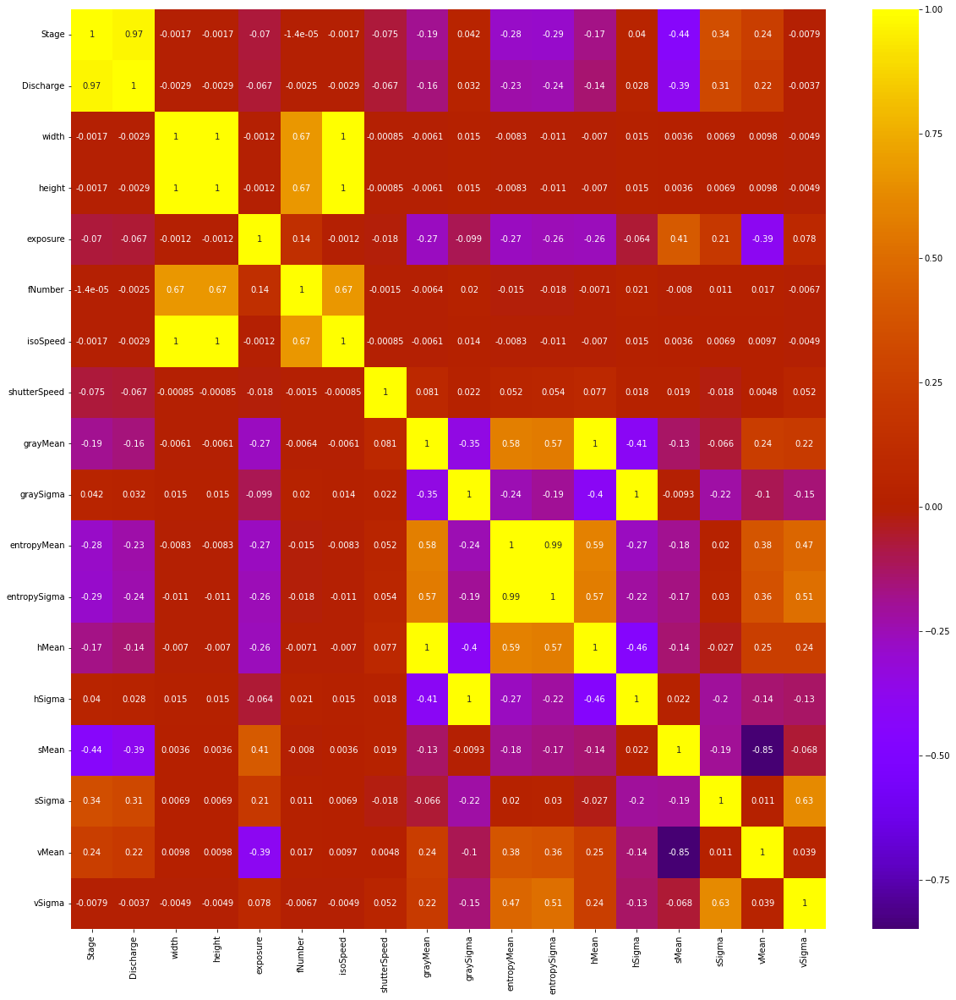

In [13]:
# save correlations to variable
corr = df_generic.corr() # pearson correlation

# generate heatmap
plt.figure(figsize= (20,20))
sns.heatmap(corr, annot=True, center=0, cmap='gnuplot')
plt.show()

#### Time series Graph

In [42]:
df_time_generic = df_generic.copy()
df_time_generic["month"] = df_time_generic.CaptureTime.dt.month
df_time_generic["yearTime"] = df_time_generic.groupby(df_time_generic.CaptureTime.dt.year).cumcount()
df_time_generic["year"] = df_time_generic.CaptureTime.dt.year
years = np.unique(df_time_generic.CaptureTime.dt.year)

rows = int(np.ceil(df_time_generic.shape[1] / 2))

##### Time series Graph based on x=yeartime, y=col

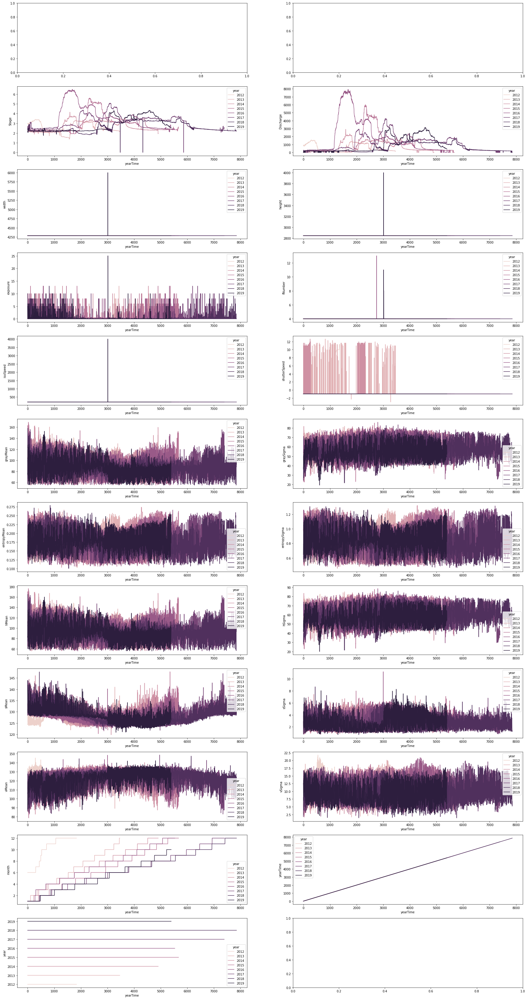

In [43]:
fig, axes = plt.subplots(nrows=rows, ncols=2, figsize=(30, 60))

for ax, col in zip(axes.flatten(), df_time_generic):
    #data_plot = df_time_generic[df_time_generic.CaptureTime.dt.year == year]
    if not np.issubdtype(df_time_generic[col].dtype, np.datetime64):
        sns.lineplot(x="yearTime", y=col,
                        data=df_time_generic, estimator=None, n_boot=0, errorbar=None, hue="year", legend="full", ax=ax)

##### Time series Graph based on x=month, y=col

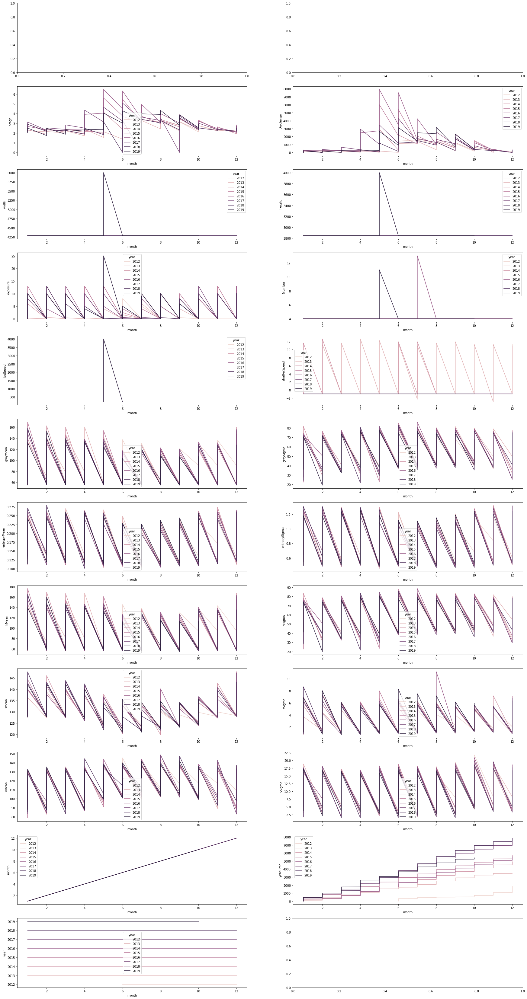

In [44]:
fig, axes = plt.subplots(nrows=rows, ncols=2, figsize=(30, 60))

for ax, col in zip(axes.flatten(), df_time_generic):
    #data_plot = df_time_generic[df_time_generic.CaptureTime.dt.year == year]
    if not np.issubdtype(df_time_generic[col].dtype, np.datetime64):
        sns.lineplot(x="month", y=col,
                        data=df_time_generic, estimator=None, n_boot=0, errorbar=None, hue="year", legend="full", ax=ax)

#### Make a plot for a linear regression model (stage)

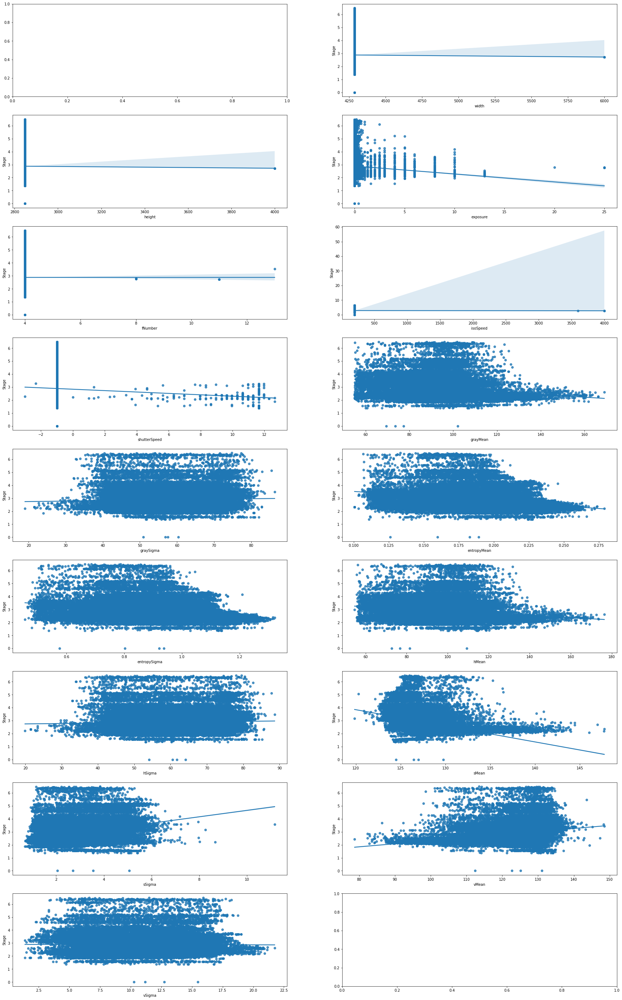

In [19]:
rows = int(np.ceil(df_x_generic.shape[1] / 2))
fig, axes = plt.subplots(nrows=rows, ncols=2, figsize=(30, 50))

for ax, col in zip(axes.flatten(), df_x_generic):
    if not np.issubdtype(df_x_generic[col].dtype, np.datetime64):
        sns.regplot(x=df_x_generic[col], y=df_y_generic.Stage, data=df_x_generic, label=col, ax=ax)

#### Make a plot for a linear regression model (discharge)

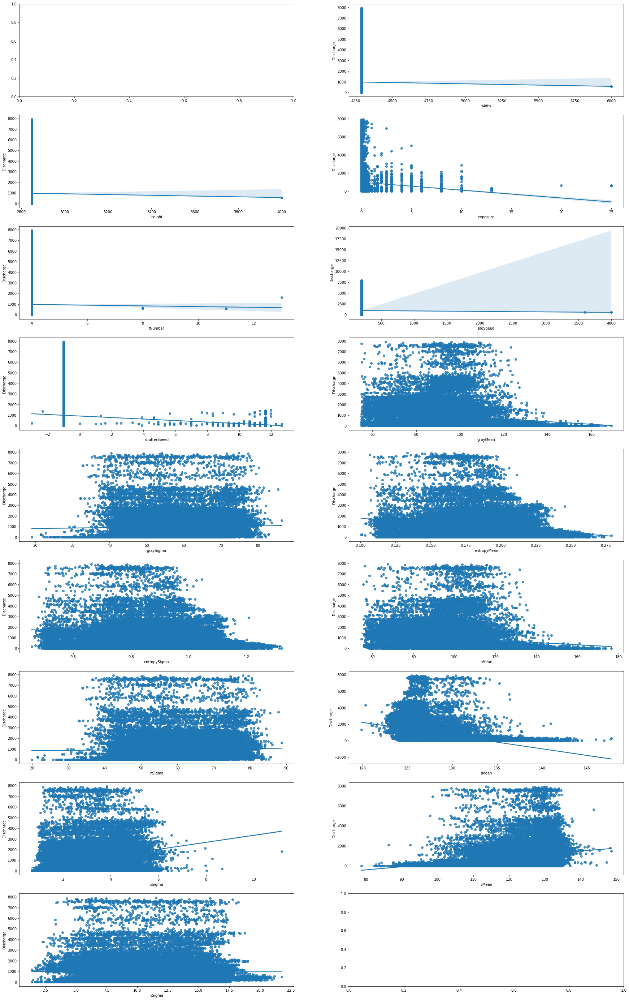

In [20]:
rows = int(np.ceil(df_x_generic.shape[1] / 2))
fig, axes = plt.subplots(nrows=rows, ncols=2, figsize=(30, 50))

for ax, col in zip(axes.flatten(), df_x_generic):
    if not np.issubdtype(df_x_generic[col].dtype, np.datetime64):
        sns.regplot(x=df_x_generic[col], y=df_y_generic.Discharge, data=df_x_generic, label=col, ax=ax)

#### Check for atypical values

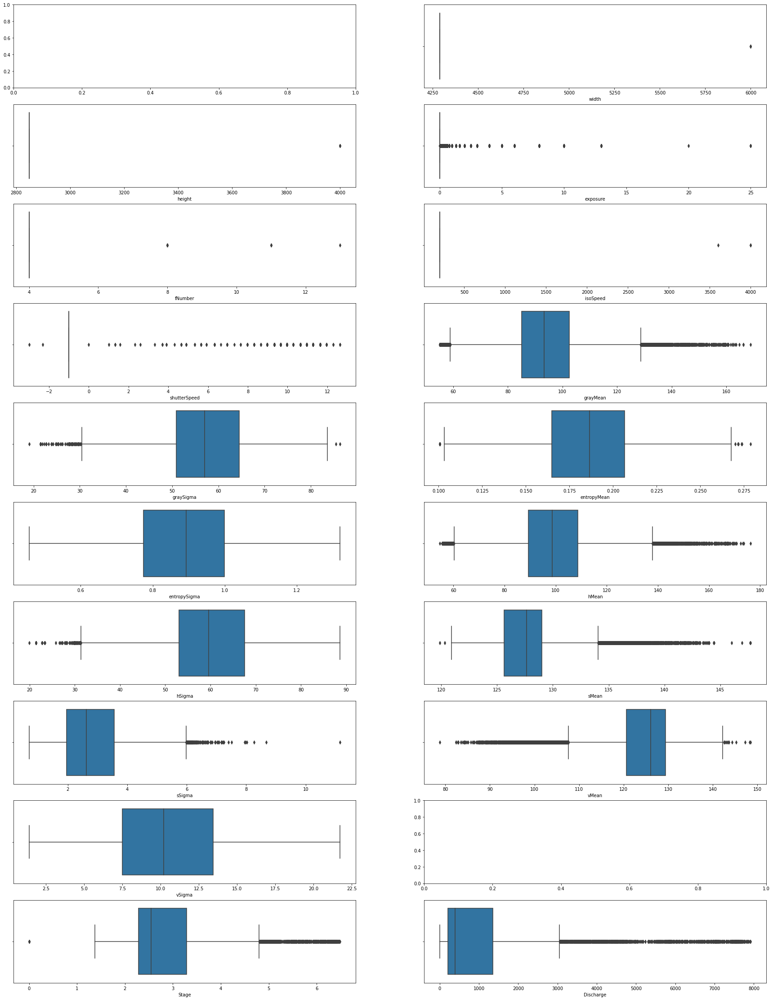

In [23]:
rows = int(np.ceil(df_generic.shape[1] / 2))
fig, axes = plt.subplots(nrows=rows, ncols=2, figsize=(30, 40))

for ax, col in zip(axes.flatten(), df_generic):
    if not np.issubdtype(df_generic[col].dtype, np.datetime64):
        sns.boxplot(x=df_generic[col], ax=ax, orient='h')

##### Check for atypical values using 

#### Feature selection 

In [1]:
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import Lasso
from sklearn.feature_selection import SelectFromModel

In [82]:
X_train, X_test, y_train, y_test = train_test_split(df_x_generic.drop(columns="CaptureTime"), df_y_generic, test_size=0.33, random_state=42)

In [85]:
pipeline = Pipeline([
                     ('scaler',StandardScaler()),
                     ('model',Lasso(tol=1e-2, max_iter=10000))
])

In [86]:
feature_selection = SelectFromModel(GridSearchCV(pipeline,
                      {'model__alpha':np.arange(0.1,10,0.1)},
                      cv = 5, scoring="neg_mean_squared_error",verbose=3, n_jobs=8), importance_getter='best_estimator_.named_steps.clf.coef_')

In [87]:
feature_selection.fit(X_train, y_train)

Fitting 5 folds for each of 99 candidates, totalling 495 fits
[CV 2/5] END ............model__alpha=0.2;, score=-524944.766 total time=   2.3s
[CV 3/5] END ............model__alpha=0.2;, score=-516434.790 total time=   2.4s
[CV 1/5] END ............model__alpha=0.2;, score=-480453.067 total time=   2.5s
[CV 2/5] END ............model__alpha=0.1;, score=-524528.880 total time=   2.9s
[CV 5/5] END ............model__alpha=0.1;, score=-499543.273 total time=   3.0s
[CV 3/5] END ............model__alpha=0.1;, score=-516367.374 total time=   3.0s
[CV 4/5] END ............model__alpha=0.1;, score=-487510.974 total time=   3.0s
[CV 1/5] END ............model__alpha=0.1;, score=-480478.149 total time=   3.0s
[CV 1/5] END model__alpha=0.30000000000000004;, score=-480518.399 total time=   2.0s
[CV 1/5] END ............model__alpha=0.4;, score=-480674.021 total time=   1.6s
[CV 5/5] END ............model__alpha=0.2;, score=-499709.653 total time=   2.4s
[CV 2/5] END model__alpha=0.300000000000000

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('model',
                                        Lasso(max_iter=10000, tol=0.01))]),
             n_jobs=8,
             param_grid={'model__alpha': array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. , 1.1, 1.2, 1.3,
       1.4, 1.5, 1.6, 1.7, 1.8, 1.9, 2. , 2.1, 2.2, 2.3, 2.4, 2.5, 2.6,
       2.7, 2.8, 2.9, 3. , 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9,
       4. , 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5. , 5.1, 5.2,
       5.3, 5.4, 5.5, 5.6, 5.7, 5.8, 5.9, 6. , 6.1, 6.2, 6.3, 6.4, 6.5,
       6.6, 6.7, 6.8, 6.9, 7. , 7.1, 7.2, 7.3, 7.4, 7.5, 7.6, 7.7, 7.8,
       7.9, 8. , 8.1, 8.2, 8.3, 8.4, 8.5, 8.6, 8.7, 8.8, 8.9, 9. , 9.1,
       9.2, 9.3, 9.4, 9.5, 9.6, 9.7, 9.8, 9.9])},
             scoring='neg_mean_squared_error', verbose=3)

In [88]:
feature_selection.best_params_

{'model__alpha': 0.1}

In [89]:
params = feature_selection.get_support()

In [91]:
df_x_generic.columns

Index(['CaptureTime', 'width', 'height', 'exposure', 'fNumber', 'isoSpeed',
       'shutterSpeed', 'grayMean', 'graySigma', 'entropyMean', 'entropySigma',
       'hMean', 'hSigma', 'sMean', 'sSigma', 'vMean', 'vSigma'],
      dtype='object')

In [92]:
df_x.loc[:, params].columns

Index(['entropySigma', 'sMean', 'sSigma'], dtype='object')